In [2]:
import numpy as np
import pandas as pd
import os,sys,glob
import matplotlib.pyplot as plt
%matplotlib inline

Processing sub-083 - ses-M60
Label image not found for /NAS/coolio/protocoles/CINOCIS/BIDS/derivatives_v2.0/DWI/sub-083/ses-M60/sub-083_ses-M60_acq-701DTICOROSPINE2D_dwi_adc.nii.gz


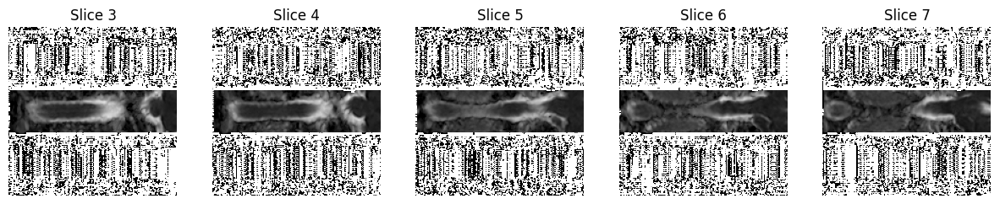

Processing sub-084 - ses-M3


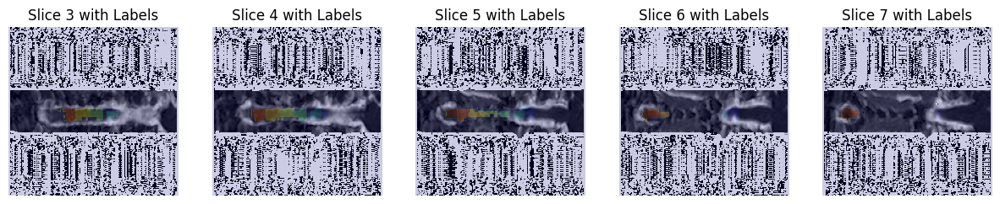

Processing sub-084 - ses-M60


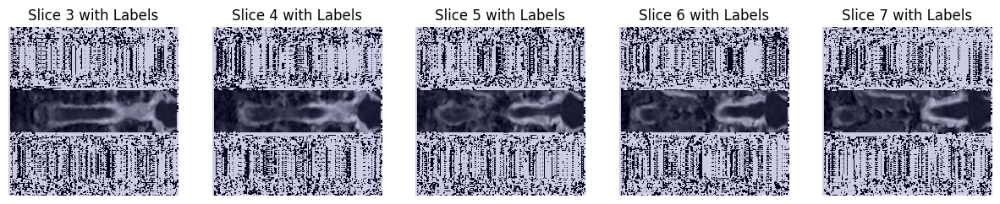

Processing sub-085 - ses-M3


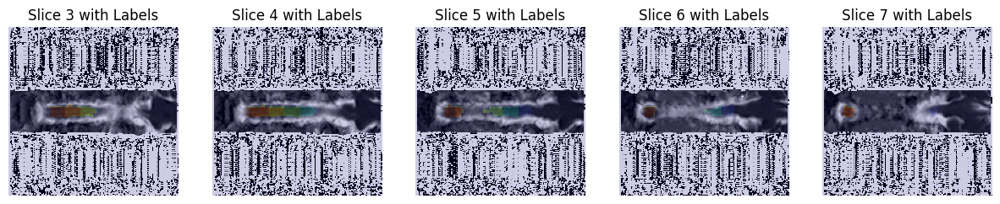

Processing sub-085 - ses-M60


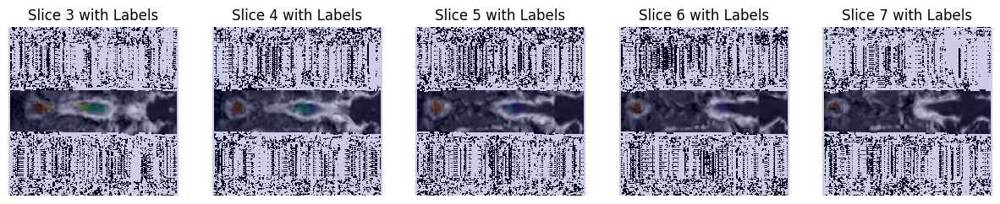

Processing sub-086 - ses-M3


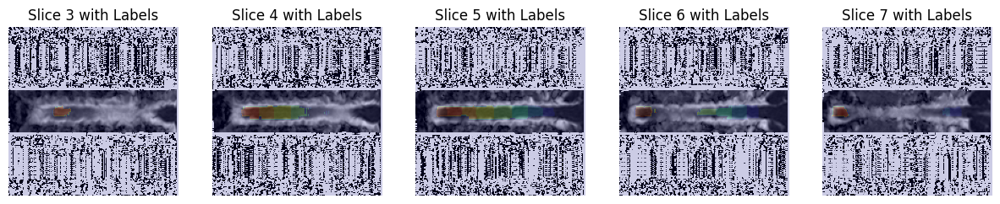

Processing sub-086 - ses-M60


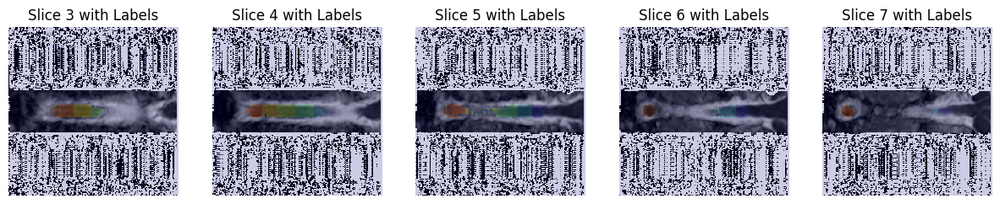

Processing sub-087 - ses-M3


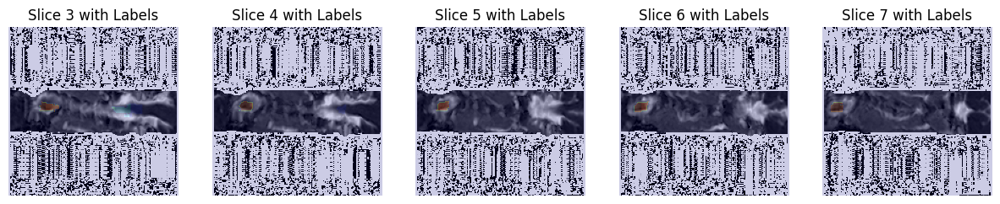

Processing sub-088 - ses-M3


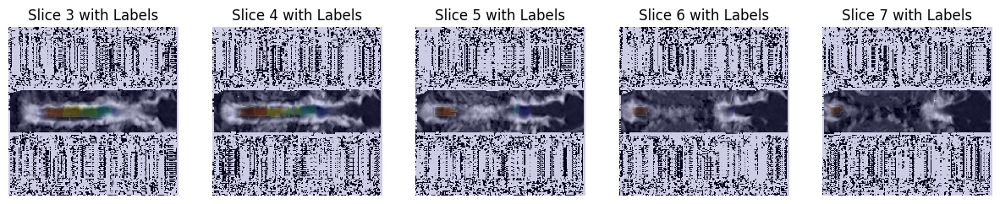

Processing sub-089 - ses-M3


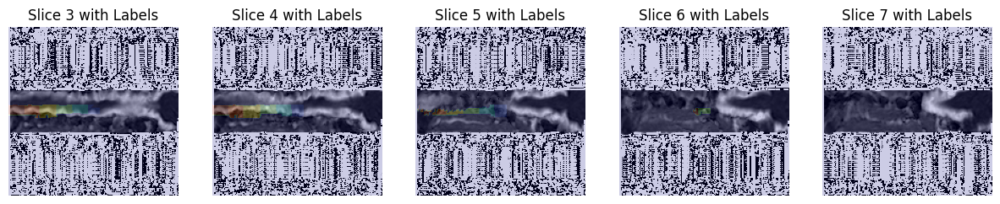

Processing sub-089 - ses-M60


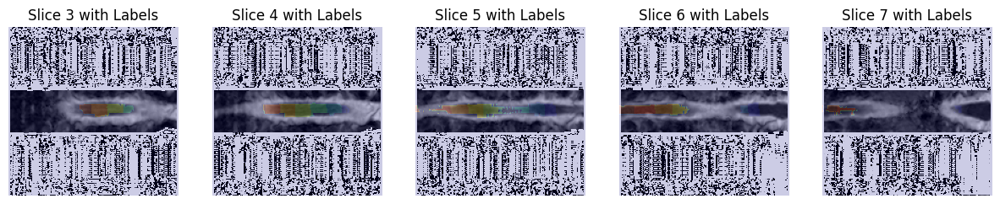

Processing sub-090 - ses-M3


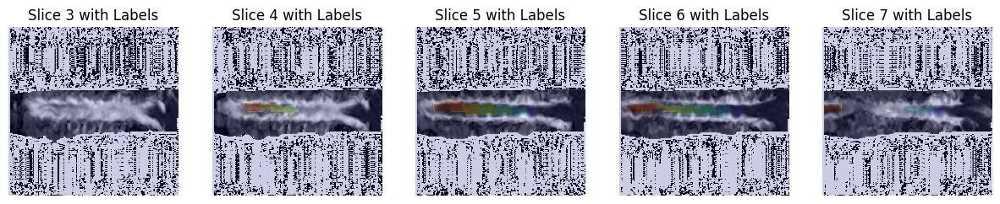

Processing sub-090 - ses-M60


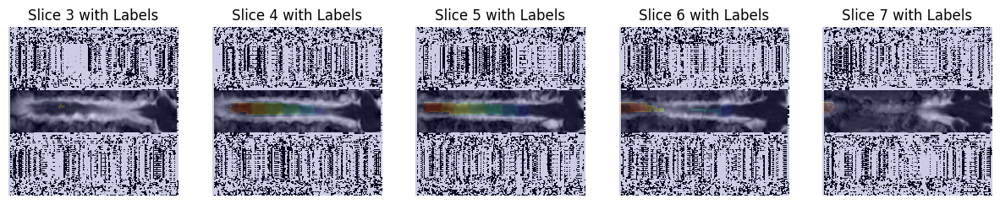

Processing sub-091 - ses-M3


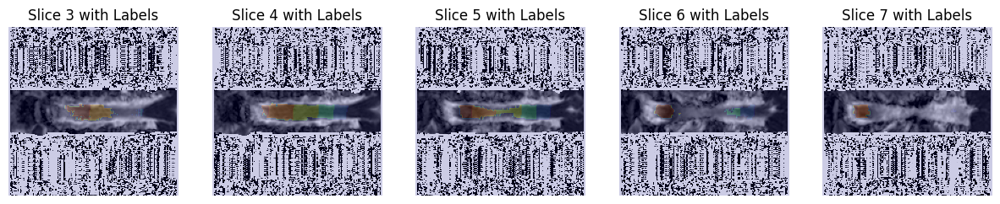

Processing sub-091 - ses-M60


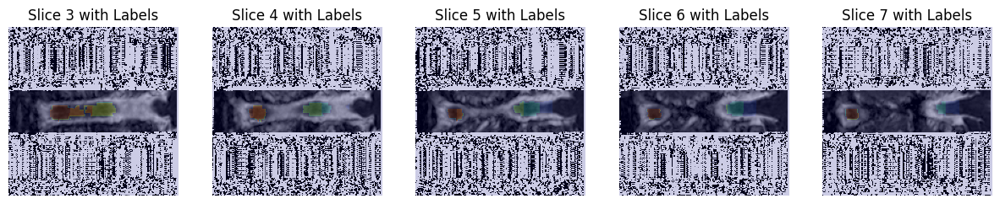

Processing sub-092 - ses-M3


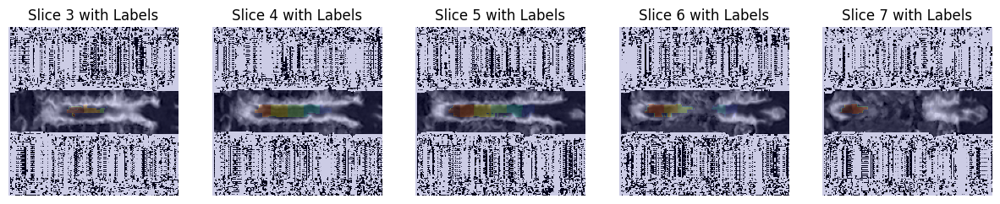

Processing sub-092 - ses-M60


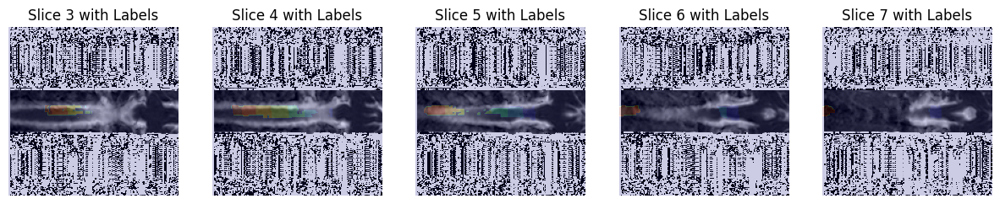

Processing sub-094 - ses-M3


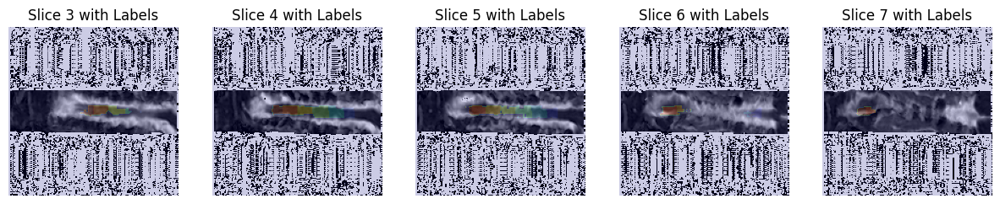

Processing sub-094 - ses-M60


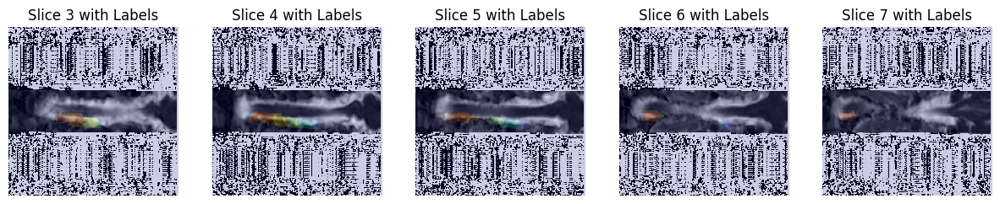

Processing sub-095 - ses-M3


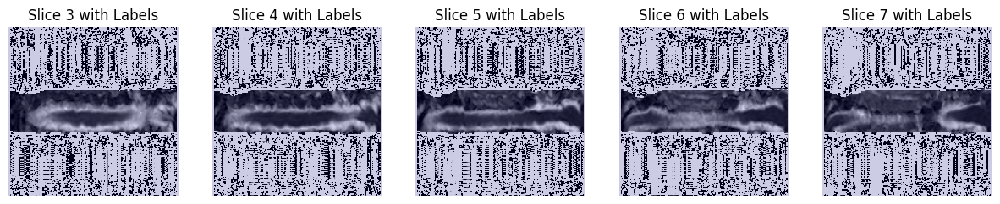

Processing sub-095 - ses-M60


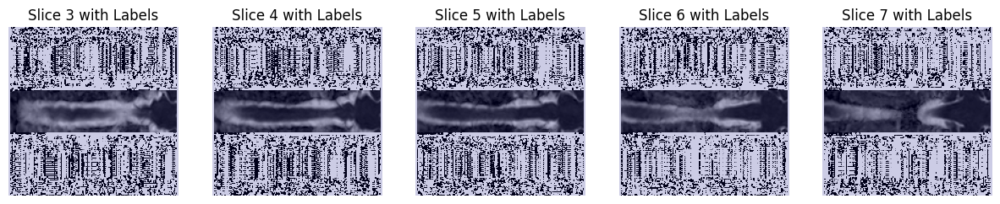

Processing sub-096 - ses-M3


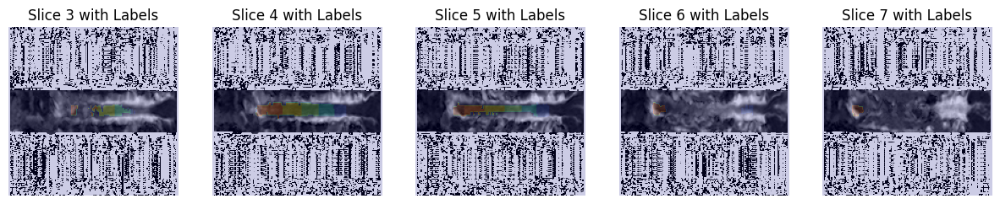

Processing sub-096 - ses-M60


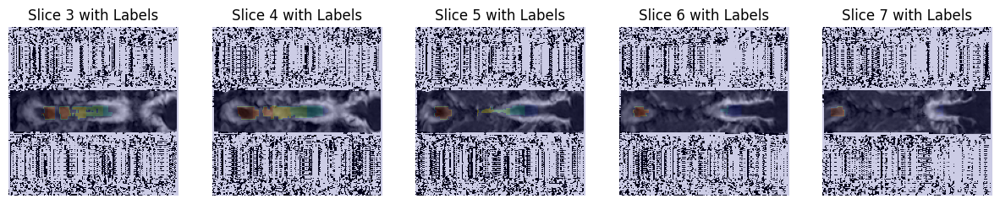

Processing sub-097 - ses-M3


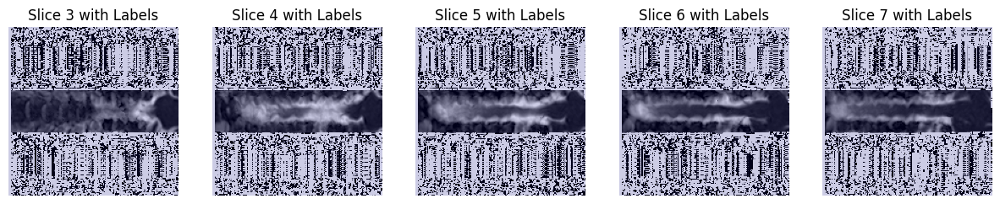

Processing sub-097 - ses-M60


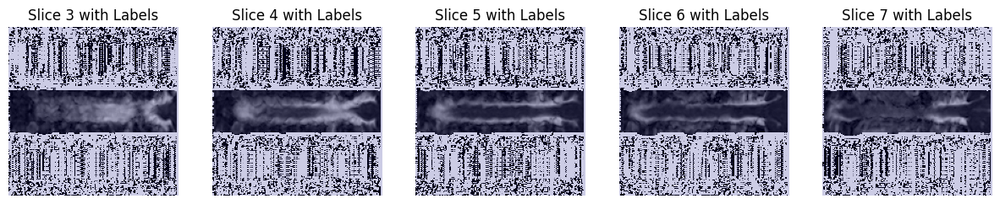

Processing sub-098 - ses-M3


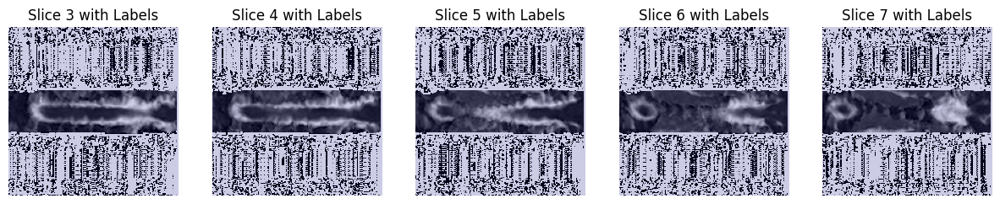

Processing sub-098 - ses-M60


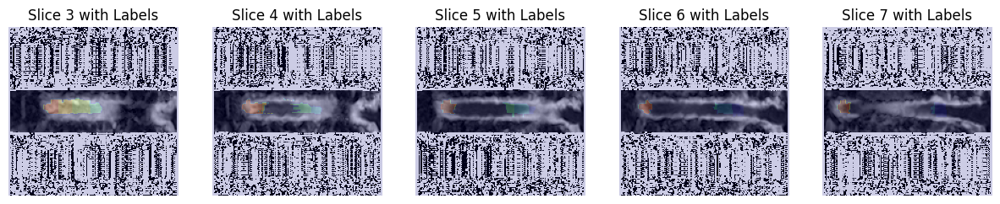

Processing sub-099 - ses-M3


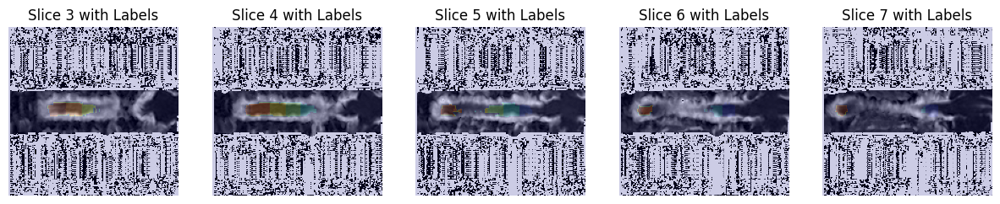

Processing sub-099 - ses-M60


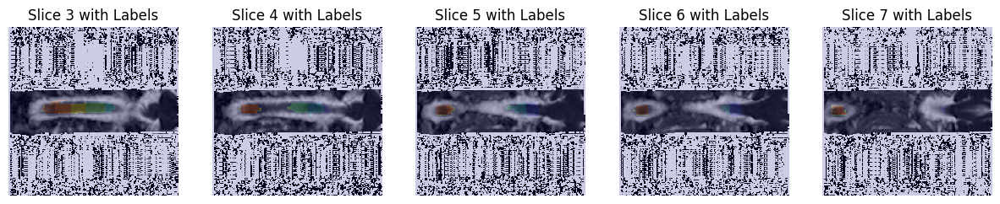

Processing sub-100 - ses-M3


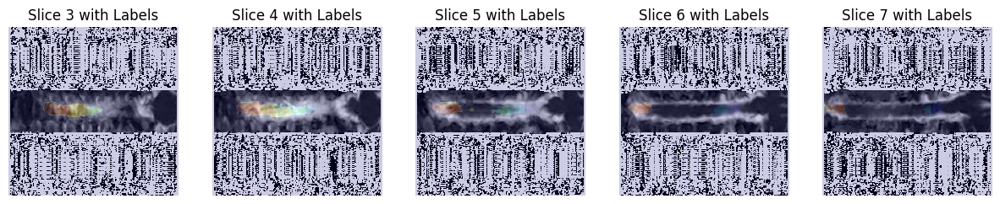

Processing sub-100 - ses-M60


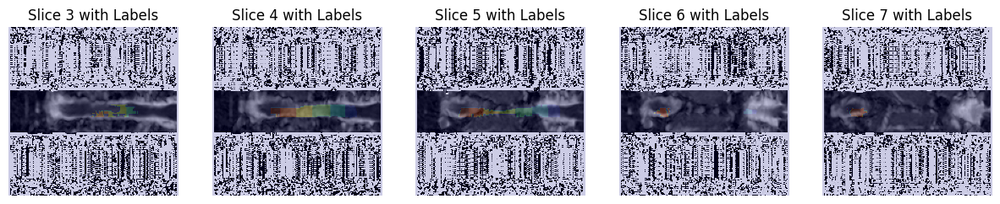

Processing sub-102 - ses-M3


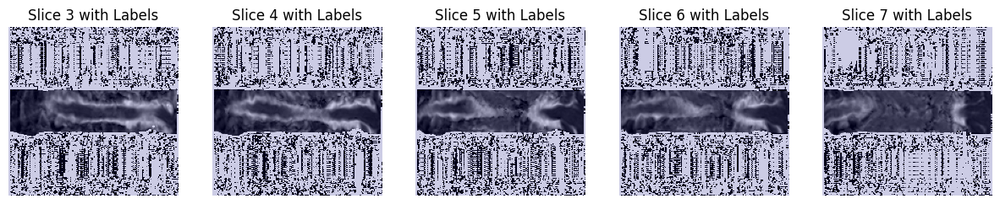

Processing sub-102 - ses-M60


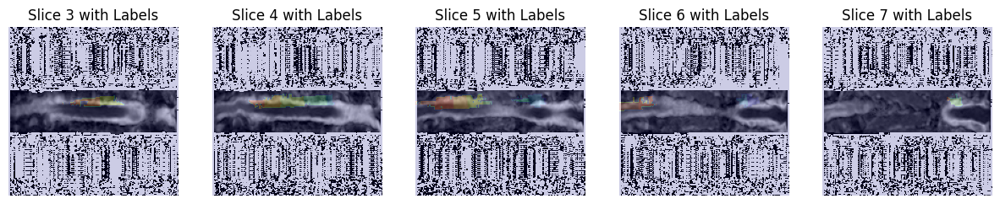

Processing sub-103 - ses-M3
Label image not found for /NAS/coolio/protocoles/CINOCIS/BIDS/derivatives_v2.0/DWI/sub-103/ses-M3/sub-103_ses-M3_acq-1701DTICOROSPINE2D_dwi_adc.nii.gz


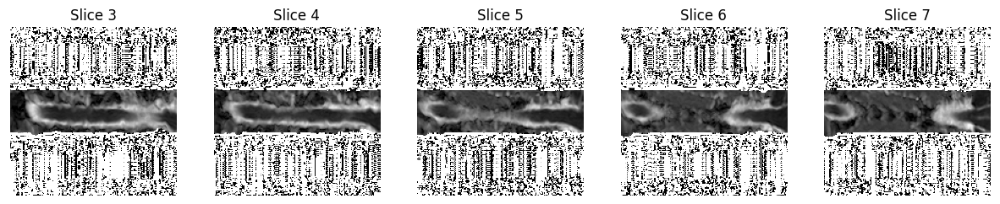

Processing sub-103 - ses-M60


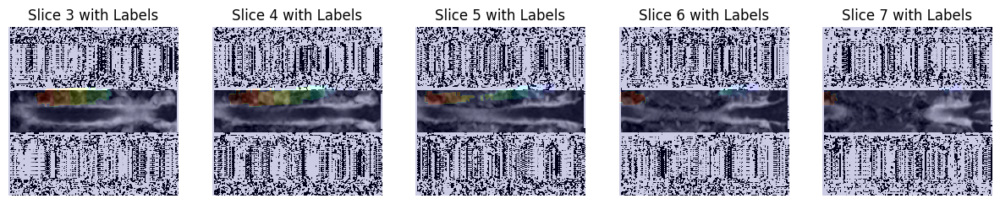

Processing sub-104 - ses-M3


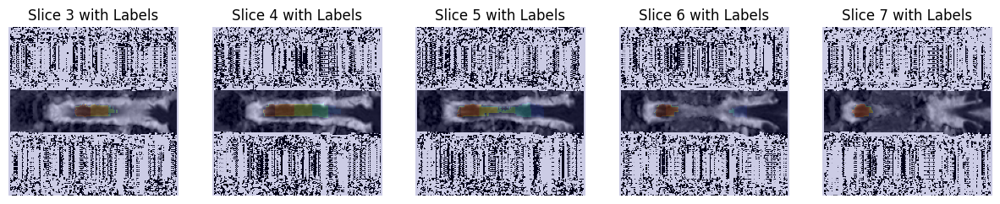

Processing sub-104 - ses-M60


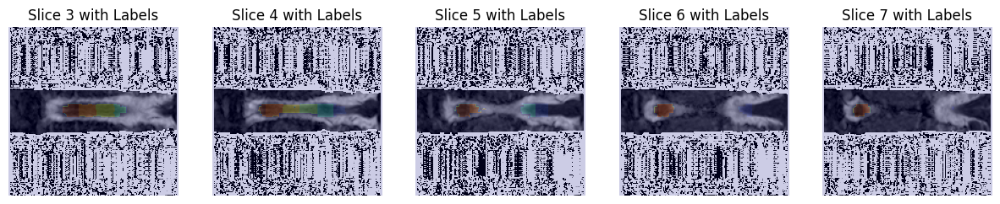

Processing sub-105 - ses-M3


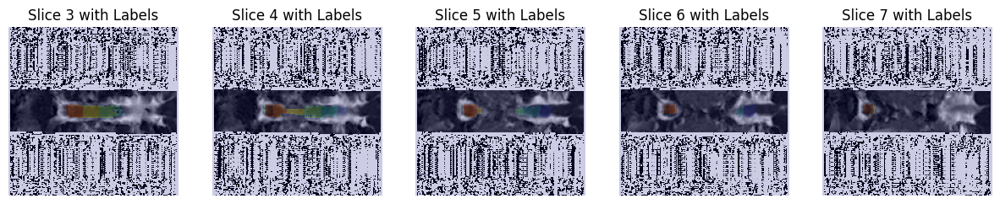

Processing sub-105 - ses-M60


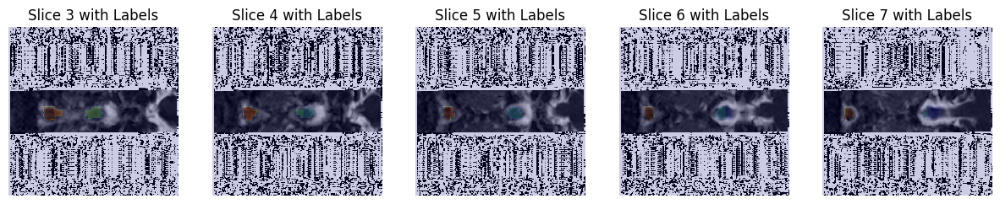

Processing sub-106 - ses-M3


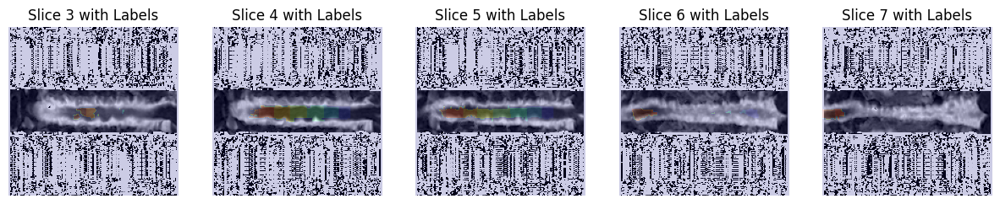

Processing sub-106 - ses-M60


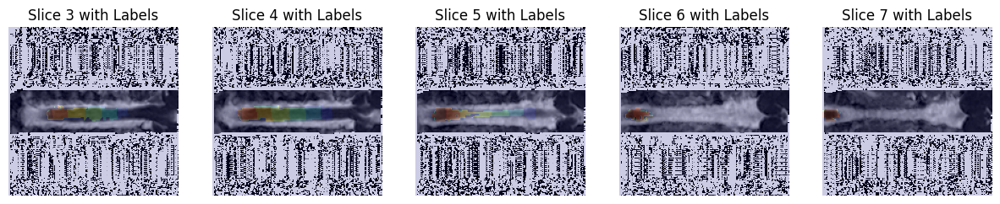

Processing sub-107 - ses-M3


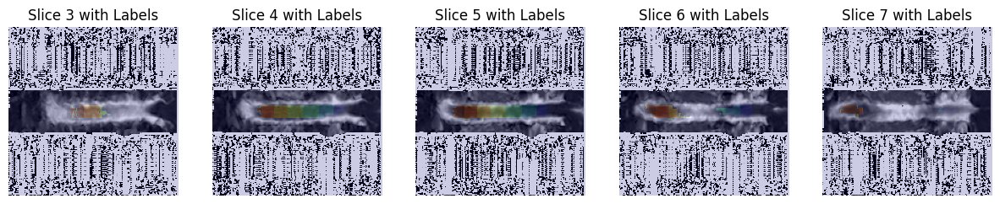

Processing sub-107 - ses-M60


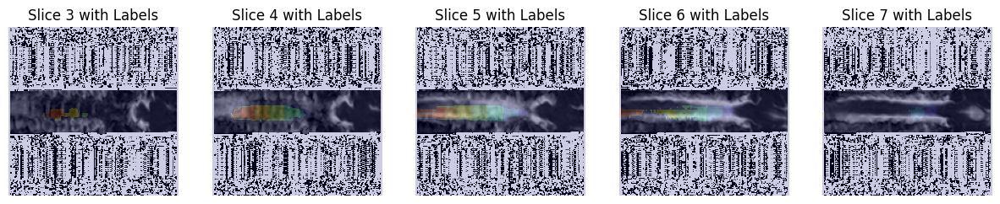

Processing sub-108 - ses-M3


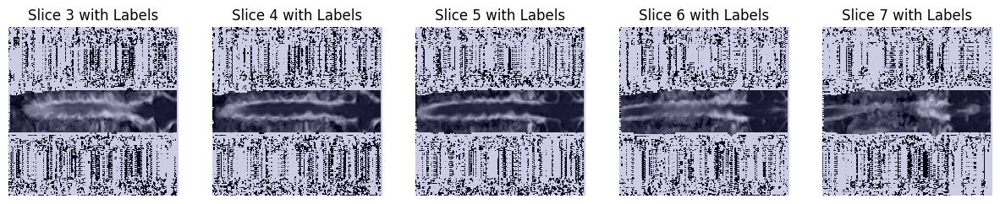

Processing sub-109 - ses-M3


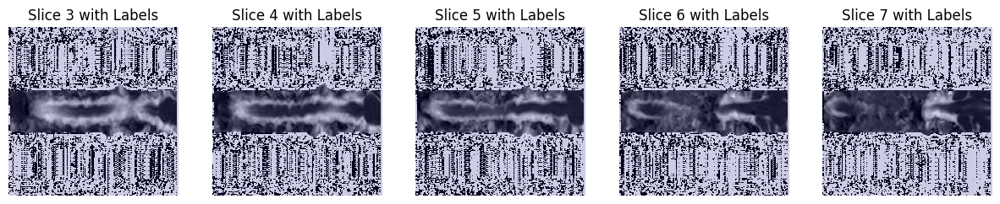

Processing sub-109 - ses-M60


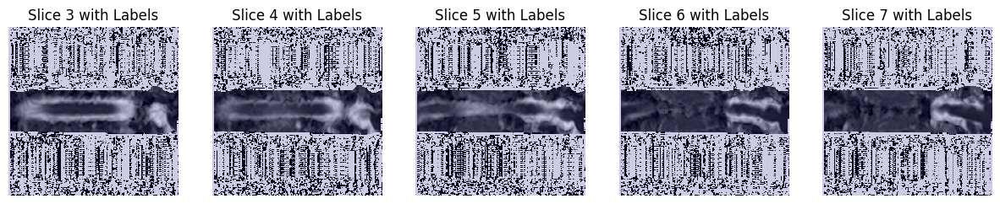

Processing sub-110 - ses-M3


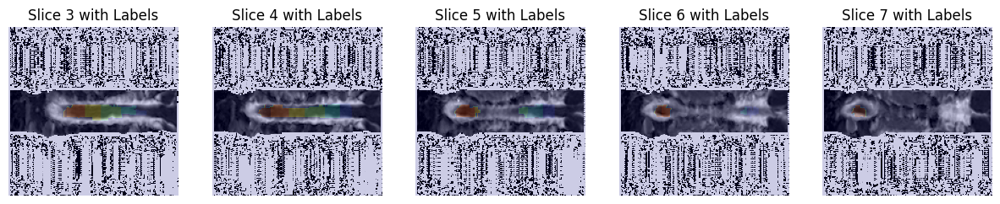

Processing sub-110 - ses-M60


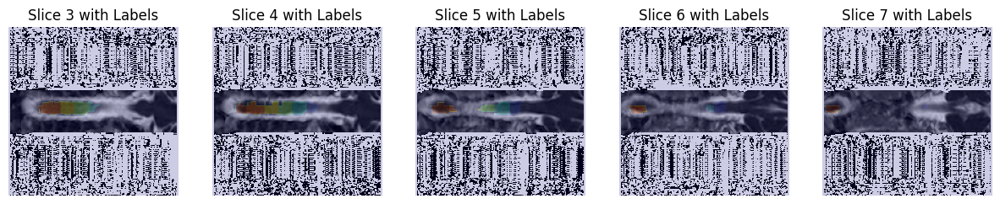

Processing sub-111 - ses-M3


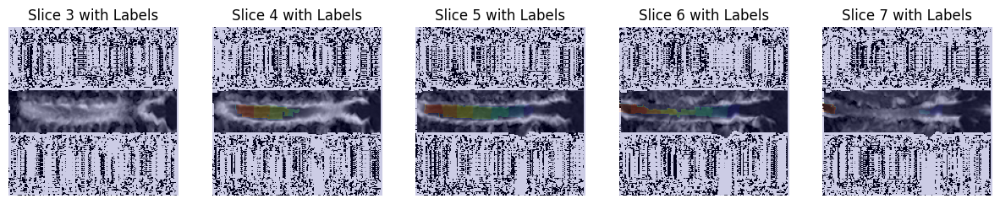

Processing sub-111 - ses-M60
Label image not found for /NAS/coolio/protocoles/CINOCIS/BIDS/derivatives_v2.0/DWI/sub-111/ses-M60/sub-111_ses-M60_acq-701DTICOROSPINE2D_dwi_adc.nii.gz


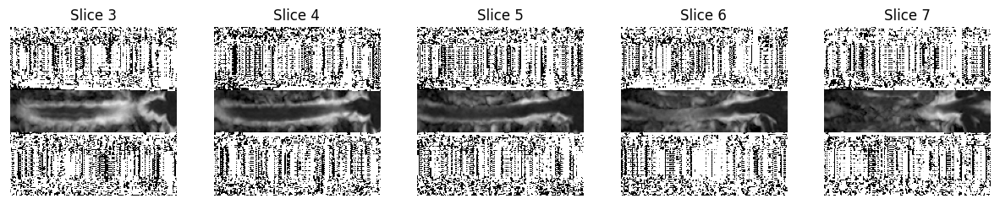

Processing sub-112 - ses-M3


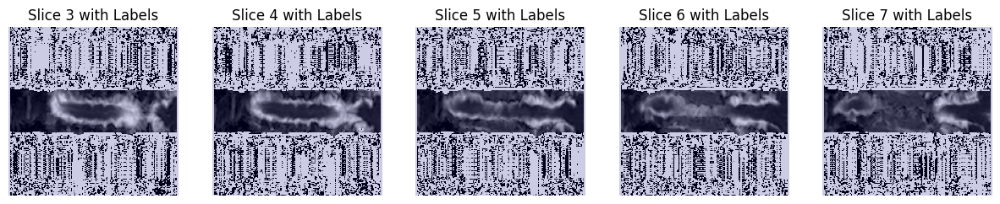

Processing sub-112 - ses-M60


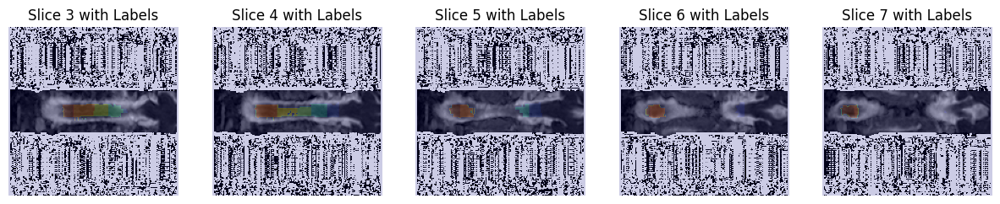

Processing sub-113 - ses-M3


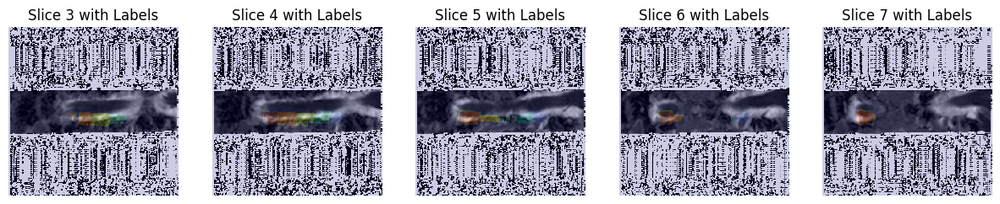

Processing sub-113 - ses-M60
Label image not found for /NAS/coolio/protocoles/CINOCIS/BIDS/derivatives_v2.0/DWI/sub-113/ses-M60/sub-113_ses-M60_acq-701DTICOROSPINE2D_dwi_adc.nii.gz


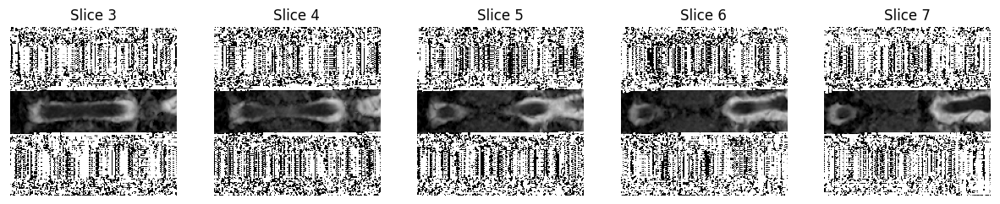

Processing sub-114 - ses-M3


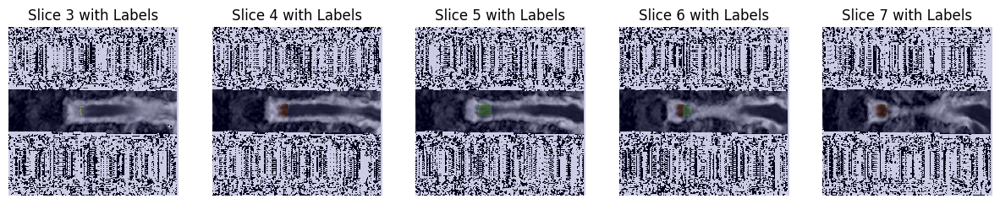

Processing sub-114 - ses-M60
Label image not found for /NAS/coolio/protocoles/CINOCIS/BIDS/derivatives_v2.0/DWI/sub-114/ses-M60/sub-114_ses-M60_acq-701DTICOROSPINE2D_dwi_adc.nii.gz


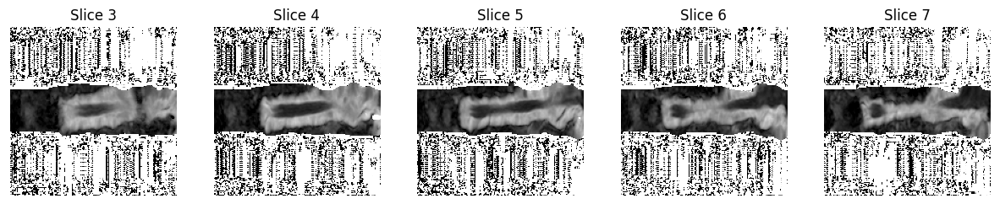

Processing sub-115 - ses-M3


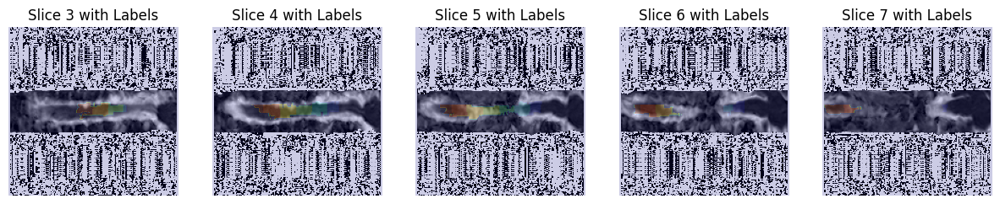

Processing sub-115 - ses-M60


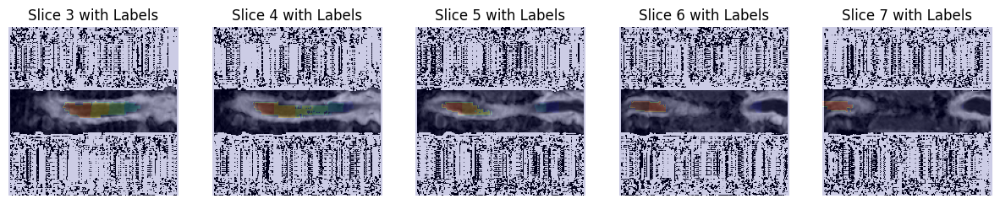

Processing sub-117 - ses-M3


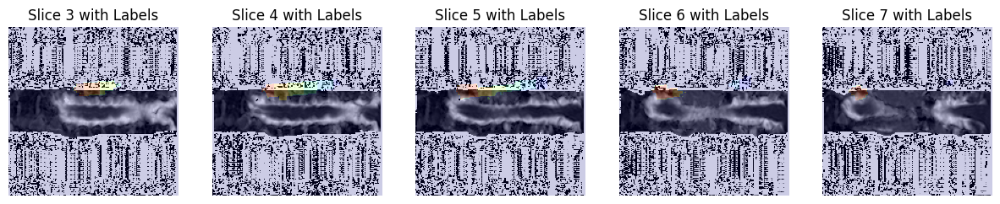

Processing sub-117 - ses-M60


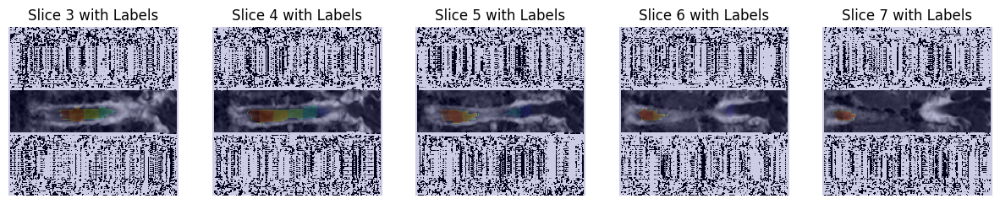

Processing sub-118 - ses-M3


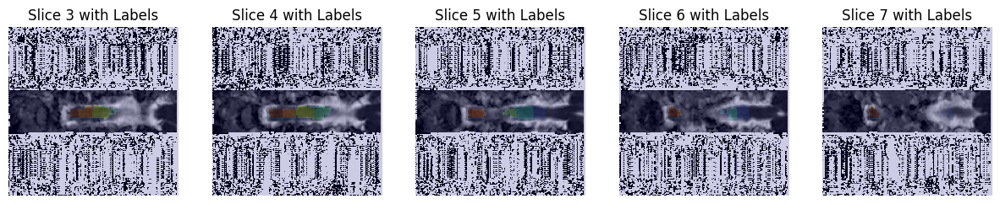

Processing sub-118 - ses-M60


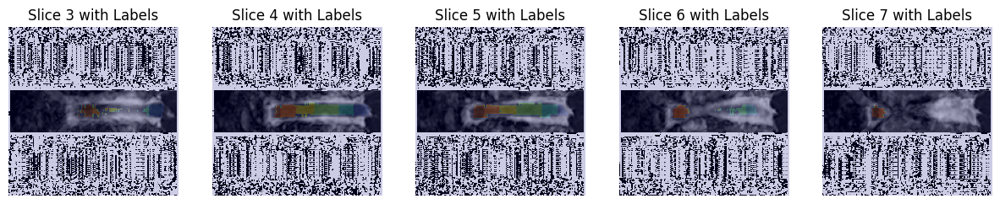

Processing sub-119 - ses-M3


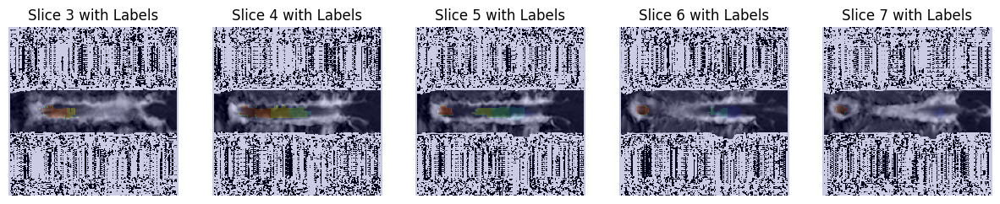

Processing sub-120 - ses-M3
Label image not found for /NAS/coolio/protocoles/CINOCIS/BIDS/derivatives_v2.0/DWI/sub-120/ses-M3/sub-120_ses-M3_acq-1701DTICOROSPINE2D_dwi_adc.nii.gz


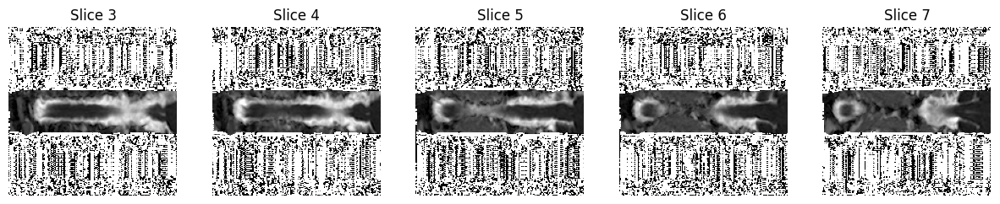

Processing sub-120 - ses-M60


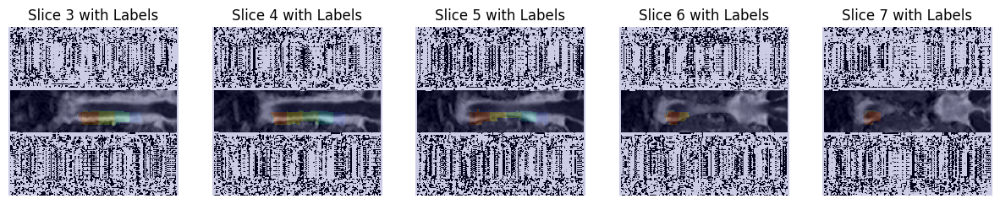

Processing sub-122 - ses-M3


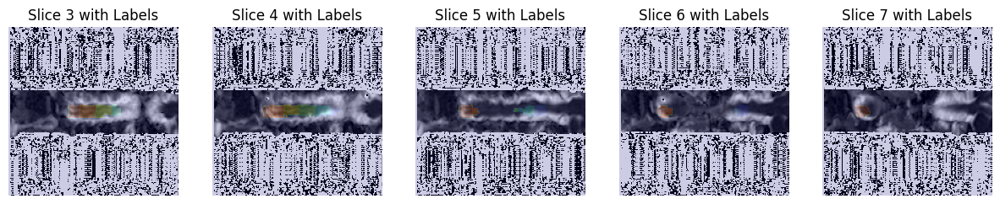

Processing sub-122 - ses-M60


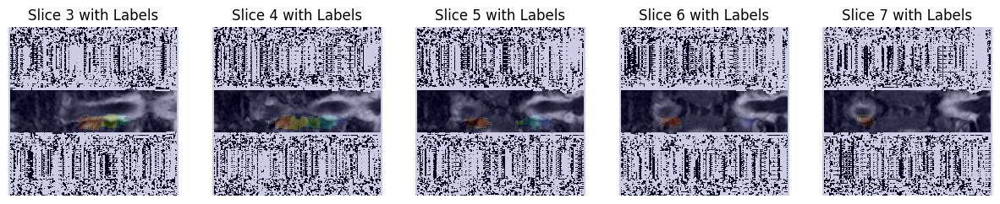

Processing sub-123 - ses-M3


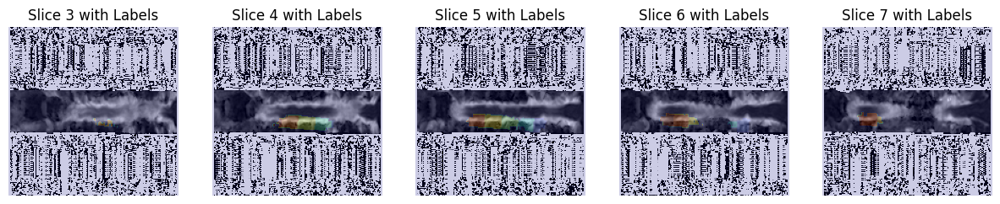

Processing sub-123 - ses-M60


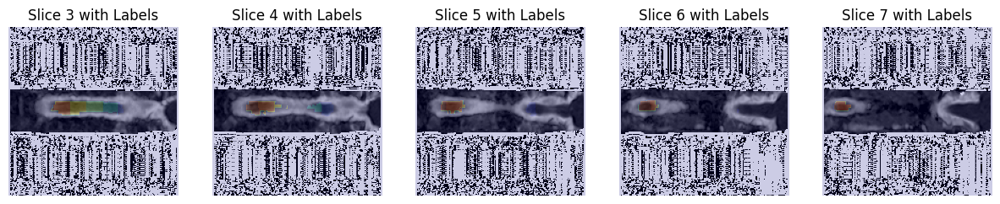

Processing sub-124 - ses-M3


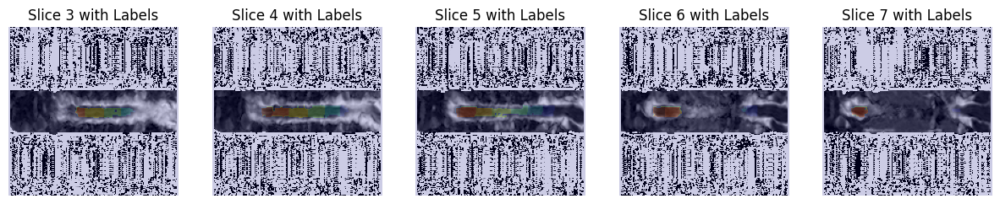

Processing sub-124 - ses-M60


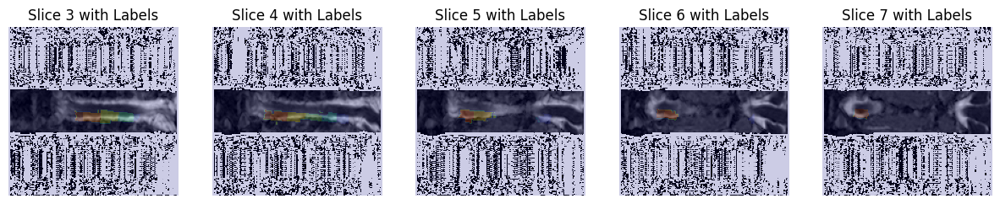

Processing sub-125 - ses-M3


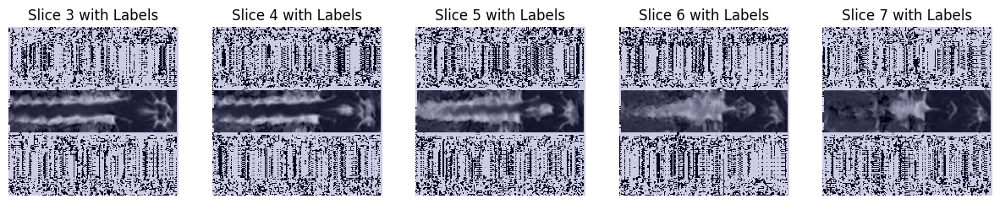

Processing sub-125 - ses-M60
Label image not found for /NAS/coolio/protocoles/CINOCIS/BIDS/derivatives_v2.0/DWI/sub-125/ses-M60/sub-125_ses-M60_acq-701DTICOROSPINE2D_dwi_adc.nii.gz


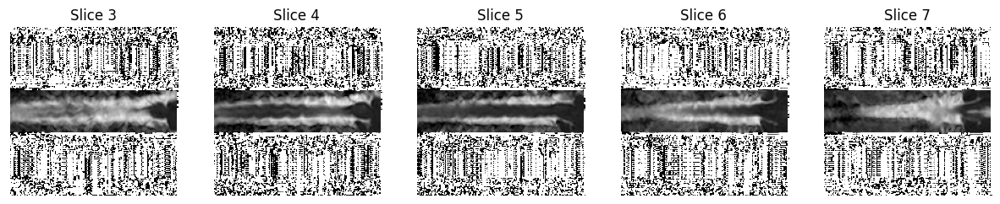

Processing sub-126 - ses-M3


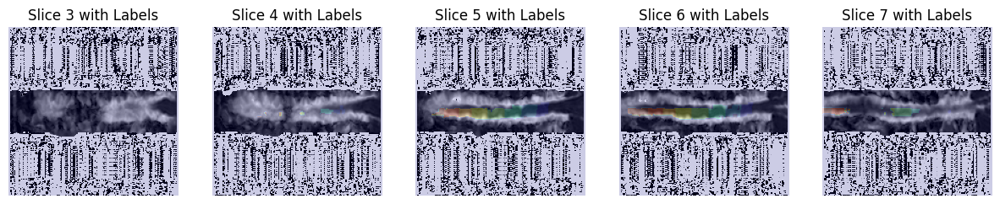

Processing sub-126 - ses-M60


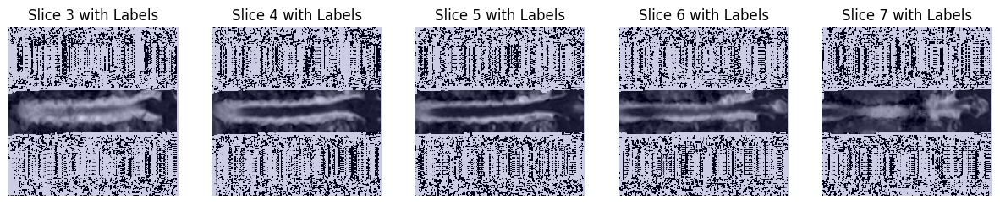

Processing sub-127 - ses-M3


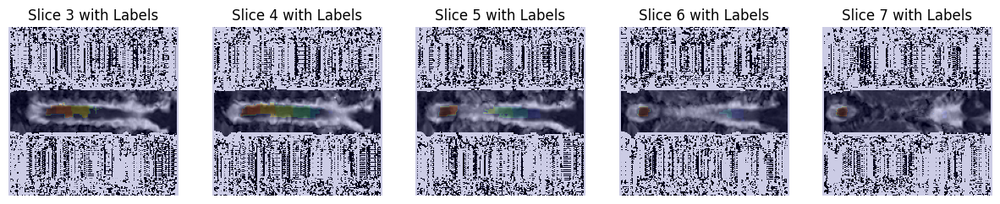

Processing sub-127 - ses-M60


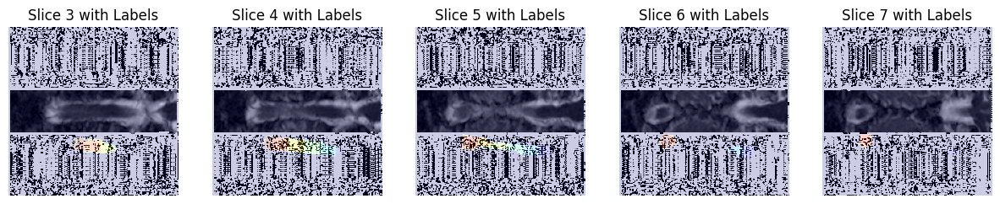

Processing sub-128 - ses-M3


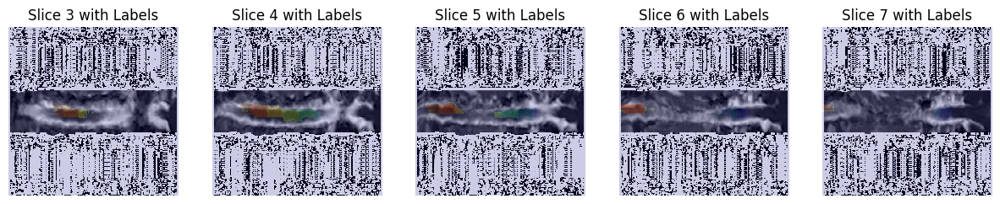

Processing sub-128 - ses-M60


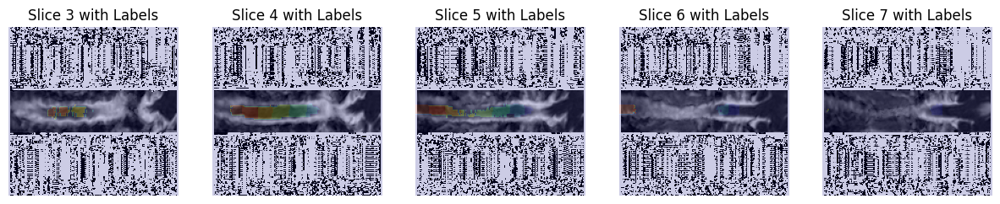

Processing sub-130 - ses-M3


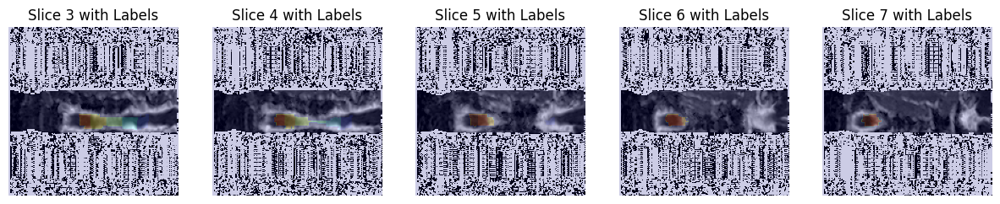

Processing sub-130 - ses-M60


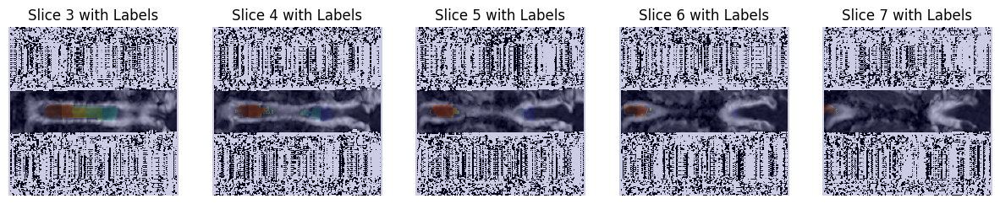

Processing sub-131 - ses-M3


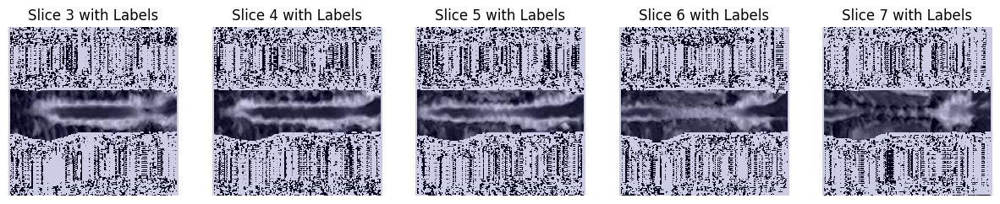

Processing sub-131 - ses-M60


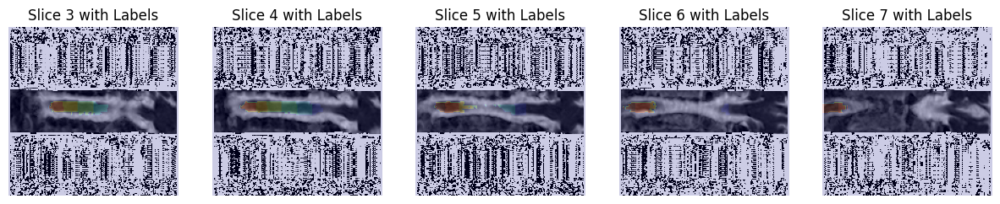

Processing sub-132 - ses-M3


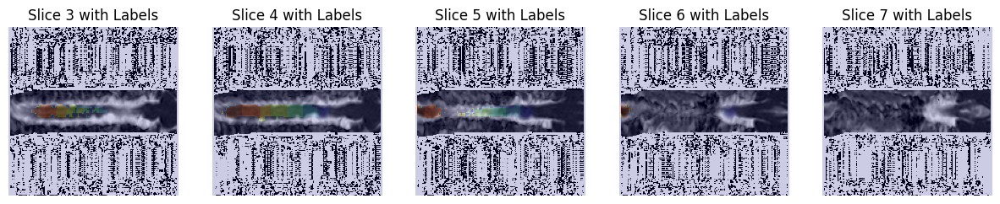

Processing sub-133 - ses-M3


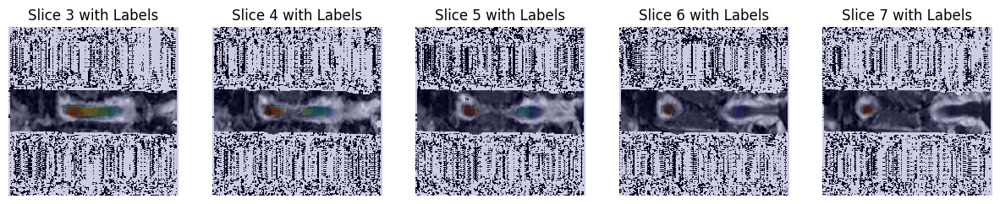

Processing sub-133 - ses-M60


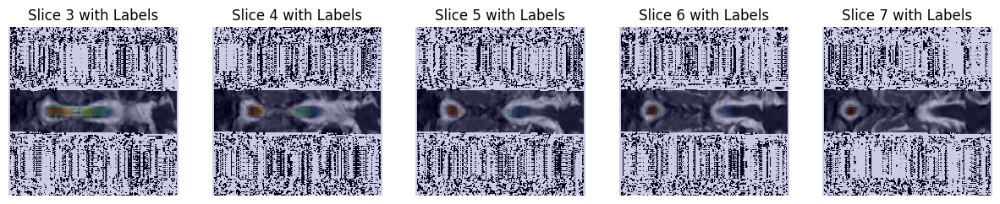

In [15]:
import nibabel as nib
import matplotlib.pyplot as plt
import glob
from matplotlib.backends.backend_pdf import PdfPages

# Define the pattern for the files to process
file_pattern = "/NAS/coolio/protocoles/CINOCIS/BIDS/derivatives_v2.0/DWI/sub-*/ses-*/*_acq-*_dwi_adc.nii.gz"

# Find all files matching the pattern
files = glob.glob(file_pattern)
# Sort the files list alphabetically
sorted_files = sorted(files, key=lambda x: os.path.basename(x))

for file_path in sorted_files[121:]:
    # Extract subject and session from the file path
    parts = file_path.split('/')
    SUBJ = parts[-3]
    SES = parts[-2]
    print(f"Processing {SUBJ} - {SES}")
    # Load the NIfTI file
    img = nib.load(file_path)
    data = img.get_fdata()

    # Define the slices to display
    slices = [data.shape[2] // 2-2,data.shape[2] // 2-1, data.shape[2] // 2, data.shape[2] // 2+1,data.shape[2] // 2+2]

    # Create a figure with 3 subplots
    fig, axes = plt.subplots(1, 5, figsize=(15, 5))

    # Display the slices with the specified dynamic range
    for i, slice_idx in enumerate(slices):
        axes[i].imshow(data[:, :, slice_idx], cmap='gray', vmin=0, vmax=0.006)
        axes[i].set_title(f'Slice {slice_idx}')
        axes[i].axis('off')

    # Load the label image if it exists
    label_img_path = f"/NAS/coolio/protocoles/CINOCIS/BIDS/derivatives_v2.0/registration/{SUBJ}/{SES}/label_on_DWI.nii.gz"
    if os.path.exists(label_img_path):
        label_img = nib.load(label_img_path)
        label_data = label_img.get_fdata()

        # Overlay the label image on the ADC image
        for i, slice_idx in enumerate(slices):
            axes[i].imshow(label_data[:, :, slice_idx], cmap='jet', alpha=0.2)
            axes[i].set_title(f'Slice {slice_idx} with Labels')
    else:
        print(f"Label image not found for {file_path}")

    # Show the figure
    plt.show()

In [20]:
#!sudo apt-get install jupyter-nbconvert
!jupyter-nbconvert --no-input --to pdf CINOCIS_CQ.ipynb

[NbConvertApp] Converting notebook CINOCIS_CQ.ipynb to pdf
[NbConvertApp] Support files will be in CINOCIS_CQ_files/
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] Making directory ./CINOCIS_CQ_files
[NbConvertApp] M